In [2]:
!pip install xgboost lightgbm catboost -q


[notice] A new release of pip is available: 25.1.1 -> 25.3
[notice] To update, run: pip install --upgrade pip


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os 
import random
from sklearn.preprocessing import LabelEncoder

pd.set_option('display.max_columns', None)
sns.set(style="whitegrid", palette="muted", font_scale=1.1)


In [4]:
def set_all_seeds(seed):
    
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    
DEFAULT_RANDOM_SEED = 42
set_all_seeds(seed=DEFAULT_RANDOM_SEED)

# Подготовка данных

In [5]:
# data_root = "https://raw.githubusercontent.com/a-milenkin/Competitive_Data_Science/main/data/"
# path = data_root + 'car_train.csv'
# train = pd.read_csv(path)
# train.to_csv('car_train.csv', index=False)

In [6]:
df = pd.read_csv('car_train.csv')
df['target_bin'] = df['target_class'].apply(lambda x: 1 if 'engine' in x else 0)

In [ ]:
# car_id - идентификатор машины
# model / car_type / fuel_type- марка, класс и тип топлива машины
# car_rating / riders - общий рейтинг  и общее число поездок к концу 2021-го кода.
# year_to_start / year_to_work - года выпуска машины и начала работы в автопарке
# main_city - город пребывания машины. (Москва или Питер)
# target_reg - количество дней до поломки.
# target_class - класс поломки (всего 9 видов)
df.head()

,car_id,model,car_type,fuel_type,car_rating,year_to_start,riders,year_to_work,target_reg,target_class,target_bin,mean_rating,distance_sum,rating_min,speed_max,user_ride_quality_median,deviation_normal_count,user_uniq,sum_rating,year_in_work,mean_distance,riders_per_year
0,y13744087j,Kia Rio X-line,economy,petrol,3.78,2015,76163,2021,108.53,another_bug,0,4.737759,1.214131e+07,0.1,180.855726,0.023174,174,170,360841.909828,6,2.023552e+06,12693.833333
1,O41613818T,VW Polo VI,economy,petrol,3.90,2015,78218,2021,35.20,electro_bug,0,4.480517,1.803909e+07,0.0,187.862734,12.306011,174,174,350457.097586,6,3.006515e+06,13036.333333
2,d-2109686j,Renault Sandero,standart,petrol,6.30,2012,23340,2017,38.62,gear_stick,0,4.768391,1.588366e+07,0.1,102.382857,2.513319,174,173,111294.241379,5,3.176732e+06,4668.000000
3,u29695600e,Mercedes-Benz GLC,business,petrol,4.04,2011,1263,2020,30.34,engine_fuel,1,3.880920,1.651883e+07,0.1,172.793237,-5.029476,174,170,4901.601379,9,1.835425e+06,140.333333
4,N-8915870N,Renault Sandero,standart,petrol,4.70,2012,26428,2017,30.45,engine_fuel,1,4.181149,1.398317e+07,0.1,203.462289,-14.260456,174,171,110499.417011,5,2.796635e+06,5285.600000


In [7]:
df['target_bin'].value_counts()

target_bin
0    1247
1    1090
Name: count, dtype: int64

In [ ]:
# user_id / car_id / ride_id - идентификаторы водителя, машины, поездки соответственно
# ride_date / rating - дата поездки и рейтинг, поставленный водителем
# ride_duration / distance / ride_cost -  длительность (время),  пройденное расстояние, стоимость поездки
# speed_avg / speed_max - средняя и максимальная скорости поездки соответственно
# stop_times / refueling - количество остановок (паузы) и флаг - была ли дозаправка.
# user_ride_quality - оценка манеры вождения машины водителя, определенная скоринговой ML системой сервиса.
# deviation_normal - общий показатель датчиков о состоянии машины, относительно эталонных показателей (нормы).

rides = pd.read_csv('rides_info.csv')
f = lambda x: x.nunique()
rides_df_gr = rides.groupby('car_id', as_index=False).agg(mean_rating = ('rating', 'mean'),
                                                   distance_sum = ('distance', 'sum'),
                                                   rating_min = ('rating', 'min'),
                                                   speed_max = ('speed_max', 'max'),
                                                   user_ride_quality_median = ('user_ride_quality', 'median'),
                                                   deviation_normal_count = ('deviation_normal', 'count'),
                                                   user_uniq = ('user_id', f))
def add_featues(df):
    
    if 'mean_rating' not in df.columns:
        data = df.merge(rides_df_gr, on = 'car_id', how = 'left')
    else:
        data = df.copy()

    data['sum_rating'] = data['mean_rating'] * data['riders']
    data['year_in_work'] = data['year_to_work'] - data['year_to_start']
    data['mean_distance'] = data['distance_sum'] / data['year_in_work'].replace(0, np.nan)
    data['riders_per_year'] = data['riders'] / data['year_in_work'].replace(0, np.nan)

    return data

In [9]:
df = add_featues(df)

In [10]:
df.head()

,car_id,model,car_type,fuel_type,car_rating,year_to_start,riders,year_to_work,target_reg,target_class,target_bin,mean_rating,distance_sum,rating_min,speed_max,user_ride_quality_median,deviation_normal_count,user_uniq,sum_rating,year_in_work,mean_distance,riders_per_year
0,y13744087j,Kia Rio X-line,economy,petrol,3.78,2015,76163,2021,108.53,another_bug,0,4.737759,1.214131e+07,0.1,180.855726,0.023174,174,170,360841.909828,6,2.023552e+06,12693.833333
1,O41613818T,VW Polo VI,economy,petrol,3.90,2015,78218,2021,35.20,electro_bug,0,4.480517,1.803909e+07,0.0,187.862734,12.306011,174,174,350457.097586,6,3.006515e+06,13036.333333
2,d-2109686j,Renault Sandero,standart,petrol,6.30,2012,23340,2017,38.62,gear_stick,0,4.768391,1.588366e+07,0.1,102.382857,2.513319,174,173,111294.241379,5,3.176732e+06,4668.000000
3,u29695600e,Mercedes-Benz GLC,business,petrol,4.04,2011,1263,2020,30.34,engine_fuel,1,3.880920,1.651883e+07,0.1,172.793237,-5.029476,174,170,4901.601379,9,1.835425e+06,140.333333
4,N-8915870N,Renault Sandero,standart,petrol,4.70,2012,26428,2017,30.45,engine_fuel,1,4.181149,1.398317e+07,0.1,203.462289,-14.260456,174,171,110499.417011,5,2.796635e+06,5285.600000


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2337 entries, 0 to 2336
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   car_id                    2337 non-null   object 
 1   model                     2337 non-null   object 
 2   car_type                  2337 non-null   object 
 3   fuel_type                 2337 non-null   object 
 4   car_rating                2337 non-null   float64
 5   year_to_start             2337 non-null   int64  
 6   riders                    2337 non-null   int64  
 7   year_to_work              2337 non-null   int64  
 8   target_reg                2337 non-null   float64
 9   target_class              2337 non-null   object 
 10  target_bin                2337 non-null   int64  
 11  mean_rating               2337 non-null   float64
 12  distance_sum              2337 non-null   float64
 13  rating_min                2337 non-null   float64
 14  speed_ma

In [12]:
targets = ['target_class', 'target_bin', 'target_reg']
cat_features = ['car_type', 'fuel_type', 'model']
features2drop = ['car_id']

filtered_features = [i for i in df.columns if (i not in targets and i not in features2drop)]
num_features = [i for i in filtered_features if i not in cat_features]

In [13]:
df[num_features].describe()

,car_rating,year_to_start,riders,year_to_work,mean_rating,distance_sum,rating_min,speed_max,user_ride_quality_median,deviation_normal_count,user_uniq,sum_rating,year_in_work,mean_distance,riders_per_year
count,2337.000000,2337.000000,2337.000000,2337.000000,2337.000000,2.337000e+03,2337.000000,2337.000000,2337.000000,2337.0,2337.000000,2337.000000,2337.000000,2.211000e+03,2211.000000
mean,4.354292,2014.040650,63711.443731,2018.069748,4.478831,1.356912e+07,0.138870,160.984884,-0.329339,174.0,171.624305,285412.889064,4.029097,3.783835e+06,18404.626945
std,0.996954,1.685852,33755.012096,2.159484,0.418588,4.253209e+06,0.163978,33.211161,9.581800,0.0,3.158088,154444.486662,2.659953,5.169398e+06,34179.517399
min,0.980000,2011.000000,23.000000,2014.000000,3.529885,1.478866e+06,0.000000,91.423508,-38.116345,174.0,136.000000,96.652874,-3.000000,-2.427282e+07,-134781.000000
25%,3.740000,2013.000000,41053.000000,2016.000000,4.155747,1.058758e+07,0.100000,123.609208,-6.141569,174.0,171.000000,180214.616379,2.000000,1.918536e+06,5614.008929
50%,4.360000,2014.000000,64415.000000,2018.000000,4.442989,1.321852e+07,0.100000,172.435742,-0.195860,174.0,172.000000,288546.876724,4.000000,2.935131e+06,13309.000000
75%,5.000000,2015.000000,86515.000000,2020.000000,4.675345,1.631788e+07,0.100000,188.597411,5.370422,174.0,173.000000,382679.343218,6.000000,4.976993e+06,28251.875000
max,8.900000,2017.000000,142862.000000,2022.000000,5.700747,3.119785e+07,1.500000,209.982840,35.770493,174.0,174.000000,750383.665517,11.000000,3.119785e+07,138813.000000


In [14]:
df.isna().sum()

car_id                        0
model                         0
car_type                      0
fuel_type                     0
car_rating                    0
year_to_start                 0
riders                        0
year_to_work                  0
target_reg                    0
target_class                  0
target_bin                    0
mean_rating                   0
distance_sum                  0
rating_min                    0
speed_max                     0
user_ride_quality_median      0
deviation_normal_count        0
user_uniq                     0
sum_rating                    0
year_in_work                  0
mean_distance               126
riders_per_year             126
dtype: int64

In [15]:
df = df.fillna(0)

In [16]:
df.isna().sum()

car_id                      0
model                       0
car_type                    0
fuel_type                   0
car_rating                  0
year_to_start               0
riders                      0
year_to_work                0
target_reg                  0
target_class                0
target_bin                  0
mean_rating                 0
distance_sum                0
rating_min                  0
speed_max                   0
user_ride_quality_median    0
deviation_normal_count      0
user_uniq                   0
sum_rating                  0
year_in_work                0
mean_distance               0
riders_per_year             0
dtype: int64

In [17]:
for col in df[cat_features].columns:
    print(f"{col}: {df[col].unique()}")

car_type: ['economy' 'standart' 'business' 'premium']
fuel_type: ['petrol' 'electro']
model: ['Kia Rio X-line' 'VW Polo VI' 'Renault Sandero' 'Mercedes-Benz GLC'
 'Skoda Rapid' 'Nissan Qashqai' 'Tesla Model 3' 'Kia Sportage'
 'Smart ForFour' 'VW Polo' 'Kia Rio' 'Smart Coupe' 'VW Tiguan'
 'Smart ForTwo' 'Kia Rio X' 'Mercedes-Benz E200' 'Renault Kaptur'
 'Mini Cooper' 'Hyundai Solaris' 'Volkswagen ID.4 ' 'Fiat 500' 'BMW 320i'
 'Audi A4' 'Audi Q3' 'Audi A3' 'MINI CooperSE']


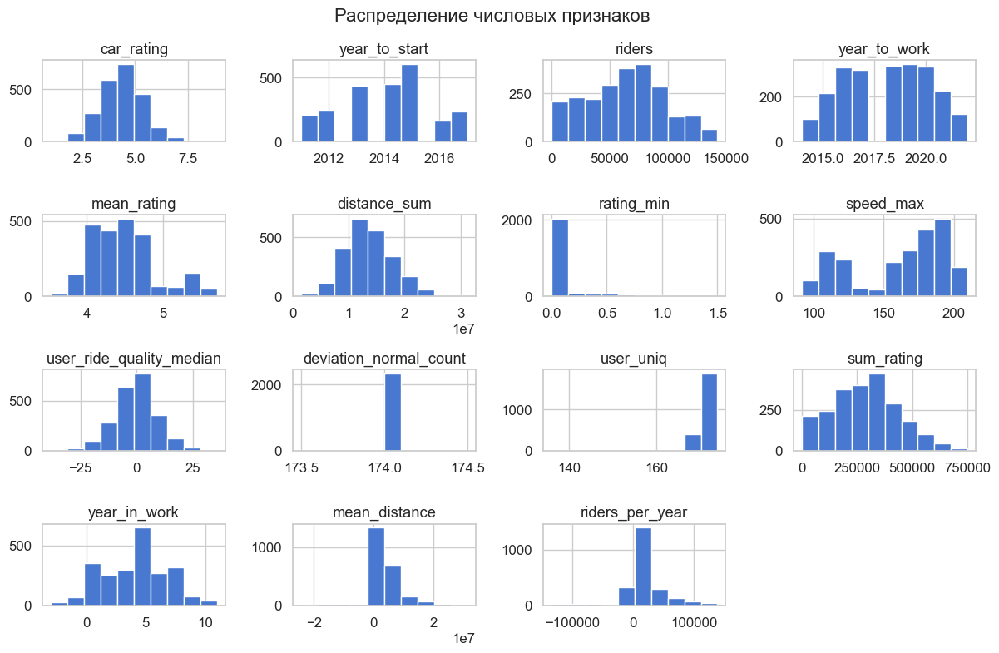

In [18]:
df[num_features].hist(figsize=(12, 8), bins=10)
plt.suptitle("Распределение числовых признаков", fontsize=16)
plt.tight_layout(pad=1.0)
plt.show()

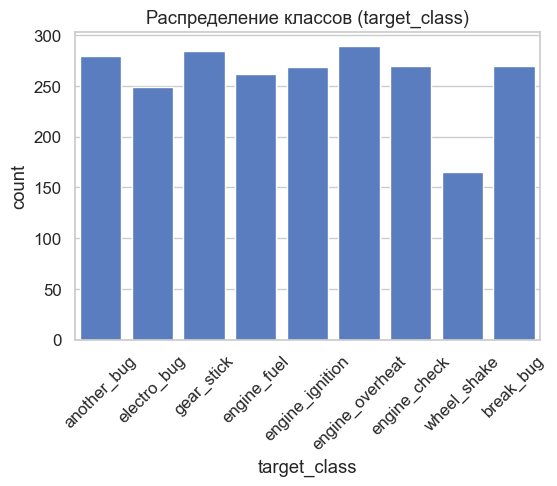

In [19]:
plt.figure(figsize=(6,4))
sns.countplot(x='target_class', data=df)
plt.title("Распределение классов (target_class)")
plt.xticks(rotation=45)
plt.show()

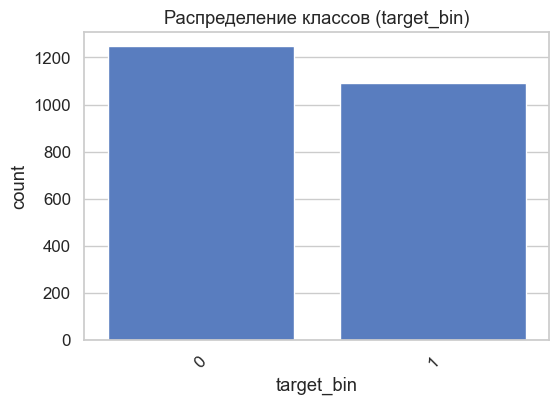

In [20]:
plt.figure(figsize=(6,4))
sns.countplot(x='target_bin', data=df)
plt.title("Распределение классов (target_bin)")
plt.xticks(rotation=45)
plt.show()

In [22]:
corr = df[num_features + ['target_bin', 'target_reg']].corr()
corr.round(2)#.to_csv('num_features_correlation.csv', sep='&')

,car_rating,year_to_start,riders,year_to_work,mean_rating,distance_sum,rating_min,speed_max,user_ride_quality_median,deviation_normal_count,user_uniq,sum_rating,year_in_work,mean_distance,riders_per_year,target_bin,target_reg
car_rating,1.00,-0.02,-0.01,-0.02,0.02,0.00,0.06,-0.00,0.03,NaN,0.00,-0.01,-0.00,-0.02,-0.03,-0.01,0.02
year_to_start,-0.02,1.00,0.99,0.06,0.00,0.01,0.00,-0.03,-0.02,NaN,-0.08,0.97,-0.59,0.05,0.23,-0.01,0.01
riders,-0.01,0.99,1.00,0.05,0.00,0.01,0.01,-0.04,-0.03,NaN,-0.07,0.98,-0.59,0.05,0.24,-0.01,0.00
year_to_work,-0.02,0.06,0.05,1.00,0.00,0.00,-0.00,-0.01,0.02,NaN,-0.06,0.05,0.77,-0.11,0.02,0.00,0.03
mean_rating,0.02,0.00,0.00,0.00,1.00,-0.13,0.36,-0.58,-0.01,NaN,0.04,0.18,-0.00,-0.04,-0.02,-0.57,-0.02
distance_sum,0.00,0.01,0.01,0.00,-0.13,1.00,-0.06,0.13,-0.00,NaN,0.05,-0.01,-0.00,0.22,0.01,0.08,-0.07
rating_min,0.06,0.00,0.01,-0.00,0.36,-0.06,1.00,-0.27,-0.01,NaN,0.01,0.07,-0.01,-0.03,-0.02,-0.12,0.04
speed_max,-0.00,-0.03,-0.04,-0.01,-0.58,0.13,-0.27,1.00,-0.02,NaN,-0.05,-0.14,0.01,0.04,0.01,0.48,0.42
user_ride_quality_median,0.03,-0.02,-0.03,0.02,-0.01,-0.00,-0.01,-0.02,1.00,NaN,-0.00,-0.03,0.03,0.01,0.01,-0.06,0.03
deviation_normal_count,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


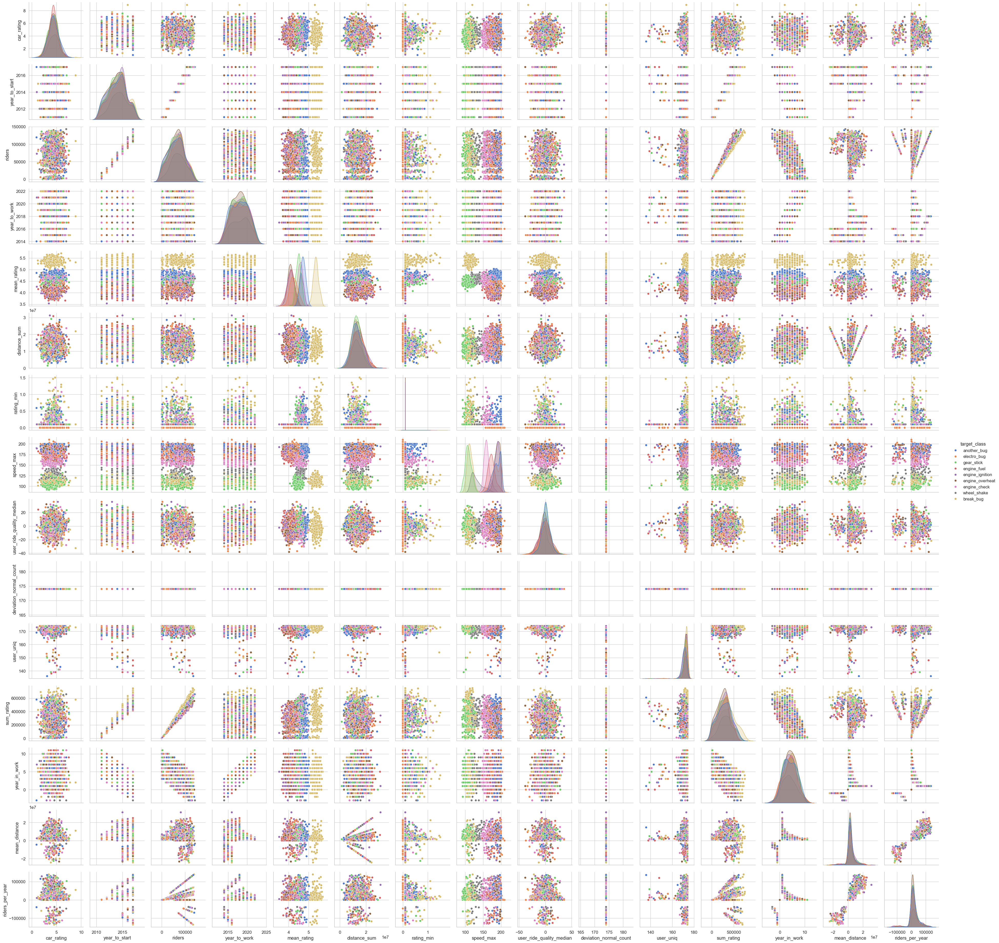

In [ ]:
sns.pairplot(df, vars=num_features, hue='target_class')
plt.show()

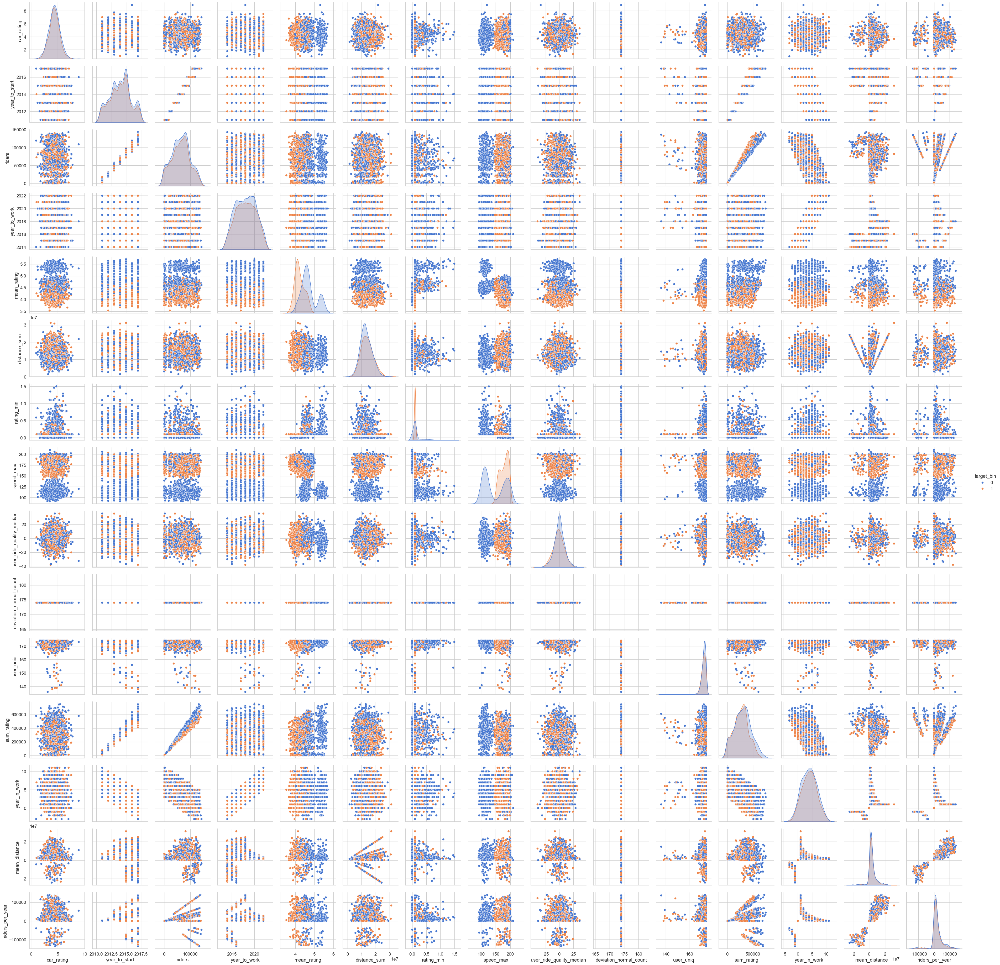

In [ ]:
sns.pairplot(df, vars=num_features, hue='target_bin')
plt.show()

In [ ]:
for col in num_features:
    print(f"{col}: mean={df[col].mean():.2f}, median={df[col].median():.2f}, std={df[col].std():.2f}")

car_rating: mean=4.35, median=4.36, std=1.00
year_to_start: mean=2014.04, median=2014.00, std=1.69
riders: mean=63711.44, median=64415.00, std=33755.01
year_to_work: mean=2018.07, median=2018.00, std=2.16
mean_rating: mean=4.48, median=4.44, std=0.42
distance_sum: mean=13569122.16, median=13218518.30, std=4253208.77
rating_min: mean=0.14, median=0.10, std=0.16
speed_max: mean=160.98, median=172.44, std=33.21
user_ride_quality_median: mean=-0.33, median=-0.20, std=9.58
deviation_normal_count: mean=174.00, median=174.00, std=0.00
user_uniq: mean=171.62, median=172.00, std=3.16
sum_rating: mean=285412.89, median=288546.88, std=154444.49
year_in_work: mean=4.03, median=4.00, std=2.66
mean_distance: mean=3579828.85, median=2788104.41, std=5100188.11
riders_per_year: mean=17412.34, median=12302.14, std=33503.91


In [ ]:
le = LabelEncoder()
for col in cat_features:
    df[col] = le.fit_transform(df[col])

In [ ]:
X_reg = df.drop(columns = targets + features2drop)
y_reg = df['target_reg']

X_reg.to_csv('X_reg.csv', index=False)
y_reg.to_csv('y_reg.csv', index=False)

In [ ]:
X_bin = df.drop(columns = targets + features2drop)
y_bin = df['target_bin']

X_bin.to_csv('X_bin.csv', index=False)
y_bin.to_csv('y_bin.csv', index=False)

In [ ]:
X_class = df.drop(columns = targets + features2drop)
y_class = df['target_class']

X_class.to_csv('X_class.csv', index=False)
y_class.to_csv('y_class.csv', index=False)